In [17]:
#Import all libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

In [18]:
#Read training data file

trainfile = '/Users/seeratchhabra/Desktop/Data/Santander_Customer_Satisfaction_TRAIN.csv'
trainData = pd.read_csv(trainfile)

#Read test data file
testfile = '/Users/seeratchhabra/Desktop/Data/Santander_Customer_Satisfaction_TEST_Without_TARGET.csv'
testData = pd.read_csv(testfile)

# copy of train data and test data to perform pre processing
cpy_traindata = trainData
cpy_testdata = testData

In [19]:
# check if same columns are present in Train and Test Data 
trainData.columns.difference(testData.columns)
# Only target column should be extra in Train data set

Index(['TARGET'], dtype='object')

In [20]:
# Percentage split of happy and unhappy customers in training dataset
per_split = pd.DataFrame(trainData.groupby('TARGET')['TARGET'].count())
per_split['Percentage'] = 100*per_split['TARGET']/trainData.shape[0]
per_split

,TARGET,Percentage
TARGET,,
0,73012,96.043147
1,3008,3.956853


In [21]:
#Shape and data types of data
print("Training Data shape:",trainData.shape)
print("Test Data shape:",testData.shape)
print("Training Data types:",trainData.dtypes)
trainData.head()
trainData.describe()


Training Data shape: (76020, 371)
Test Data shape: (75818, 370)
Training Data types: ID                                 int64
var3                               int64
var15                              int64
imp_ent_var16_ult1               float64
imp_op_var39_comer_ult1          float64
imp_op_var39_comer_ult3          float64
imp_op_var40_comer_ult1          float64
imp_op_var40_comer_ult3          float64
imp_op_var40_efect_ult1          float64
imp_op_var40_efect_ult3          float64
imp_op_var40_ult1                float64
imp_op_var41_comer_ult1          float64
imp_op_var41_comer_ult3          float64
imp_op_var41_efect_ult1          float64
imp_op_var41_efect_ult3          float64
imp_op_var41_ult1                float64
imp_op_var39_efect_ult1          float64
imp_op_var39_efect_ult3          float64
imp_op_var39_ult1                float64
imp_sal_var16_ult1               float64
ind_var1_0                         int64
ind_var1                           int64
ind_var2_0   

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,...,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
count,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,...,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,7.602000e+04,76020.000000
mean,75964.050723,-1523.199277,33.212865,86.208265,72.363067,119.529632,3.559130,6.472698,0.412946,0.567352,...,7.935824,1.365146,12.215580,8.784074,31.505324,1.858575,76.026165,56.614351,1.172358e+05,0.039569
std,43781.947379,39033.462364,12.956486,1614.757313,339.315831,546.266294,93.155749,153.737066,30.604864,36.513513,...,455.887218,113.959637,783.207399,538.439211,2013.125393,147.786584,4040.337842,2852.579397,1.826646e+05,0.194945
min,1.000000,-999999.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.163750e+03,0.000000
25%,38104.750000,2.000000,23.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.787061e+04,0.000000
50%,76043.000000,2.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.064092e+05,0.000000
75%,113748.750000,2.000000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.187563e+05,0.000000
max,151838.000000,238.000000,105.000000,210000.000000,12888.030000,21024.810000,8237.820000,11073.570000,6600.000000,6600.000000,...,50003.880000,20385.720000,138831.630000,91778.730000,438329.220000,24650.010000,681462.900000,397884.300000,2.203474e+07,1.000000


In [22]:
# Remove columns from training and test dataset which have 0 standard deviation 
counter_col_removed = 0
for (columnName, columnData) in cpy_traindata.iteritems():
    std_dev = ( round(cpy_traindata[columnName].std(),2))
    if (std_dev == 0):
        cpy_traindata = cpy_traindata.drop(columns = columnName)
        cpy_testdata = cpy_testdata.drop(columns = columnName)
        print(columnName)
        counter_col_removed = counter_col_removed + 1
        
print("After removing columns:",counter_col_removed, "training data shape: ",cpy_traindata.shape)
print("After removing columns:",counter_col_removed, "test data shape: ",cpy_testdata.shape)

ind_var2_0
ind_var2
ind_var27_0
ind_var28_0
ind_var28
ind_var27
ind_var41
ind_var46_0
ind_var46
num_var27_0
num_var28_0
num_var28
num_var27
num_var41
num_var46_0
num_var46
saldo_var28
saldo_var27
saldo_var41
saldo_var46
imp_amort_var18_hace3
imp_amort_var34_hace3
imp_reemb_var13_hace3
imp_reemb_var33_hace3
imp_trasp_var17_out_hace3
imp_trasp_var33_out_hace3
num_var2_0_ult1
num_var2_ult1
num_reemb_var13_hace3
num_reemb_var33_hace3
num_trasp_var17_out_hace3
num_trasp_var33_out_hace3
saldo_var2_ult1
saldo_medio_var13_medio_hace3
After removing columns: 34 training data shape:  (76020, 337)
After removing columns: 34 test data shape:  (75818, 336)


In [23]:
# remove columns from training and test dataset which are exactly similar
Columns_to_remove = []
col_names = cpy_traindata.columns
for i in range(len(col_names)-1):
    vals = cpy_traindata[col_names[i]].values
    for j in range(i+1,len(col_names)):
        if np.array_equal(vals, cpy_traindata[col_names[j]].values):
            Columns_to_remove.append(col_names[j])
            print(col_names[j])

cpy_traindata.drop(Columns_to_remove, axis=1, inplace=True)
cpy_testdata.drop(Columns_to_remove, axis=1, inplace=True)
print("After removing columns:",len(Columns_to_remove), "shape: ",cpy_traindata.shape)
print("After removing columns:",len(Columns_to_remove), "test data shape: ",cpy_testdata.shape)

ind_var29_0
ind_var29
ind_var13_medio
ind_var18
ind_var26
ind_var25
ind_var32
ind_var34
ind_var37
ind_var39
num_var29_0
num_var29
num_var13_medio
num_var18
num_var26
num_var25
num_var32
num_var34
num_var37
num_var39
saldo_var29
saldo_medio_var13_medio_ult1
delta_num_reemb_var13_1y3
delta_num_reemb_var17_1y3
delta_num_reemb_var33_1y3
delta_num_trasp_var17_in_1y3
delta_num_trasp_var17_out_1y3
delta_num_trasp_var33_in_1y3
delta_num_trasp_var33_out_1y3
After removing columns: 29 shape:  (76020, 308)
After removing columns: 29 test data shape:  (75818, 307)


In [24]:
# Remove ID column from training and test dataset
cpy_traindata.drop("ID", axis=1, inplace=True)
cpy_testdata.drop("ID", axis=1, inplace=True)
print("After removing ID column,training data shape: ",cpy_traindata.shape)
print("After removing ID column test data shape: ",cpy_testdata.shape)

After removing ID column,training data shape:  (76020, 307)
After removing ID column test data shape:  (75818, 306)


In [25]:
# check if there are any missing values in any column
print("Number of null values in train data",cpy_traindata.isnull().sum().sum())
print("Number of null values in test data",cpy_testdata.isnull().sum().sum())
# no missing values

Number of null values in train data 0
Number of null values in test data 0


In [26]:
#something seems off in var-3 with value -999999 as observed using describe 
cpy_traindata.groupby('var3')['var3'].count().sort_values(ascending =False)
cpy_testdata.groupby('var3')['var3'].count().sort_values(ascending =False)
# Replace -999999 with the most common value 2
cpy_traindata = cpy_traindata.replace(-999999,2)
cpy_testdata = cpy_testdata.replace(-999999,2)

<function matplotlib.pyplot.show(*args, **kw)>

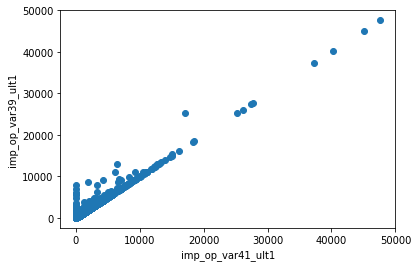

In [27]:
# Find correlation matrix
corr_matrix = pd.DataFrame(cpy_traindata.iloc[:,:-1].corr())

# Ploting graph between 1 set of highly correlated variables
plt.scatter(cpy_traindata["imp_op_var41_ult1"], cpy_traindata["imp_op_var39_ult1"]) 
plt.xlabel('imp_op_var41_ult1')
plt.ylabel('imp_op_var39_ult1')
plt.show

In [28]:
# remove columns which are highly correlated except for target column
arr = corr_matrix.values
index_names = corr_matrix.index
col_names = corr_matrix.columns

#  Get indices where such threshold is crossed; avoid diagonal elems
R,C = np.where(np.triu(arr,1) > 0.98)

# Arrange those in columns and put out as a dataframe
out_arr = np.column_stack((index_names[R],col_names[C],arr[R,C]))
df_out = pd.DataFrame(out_arr,columns=['row_name','col_name','corr_value'])

#Remove columns listed in col_name and keep columns in row_name ( Need to keep only 1 of related columns)
df_out = df_out.sort_values(by = 'corr_value', ascending = False)
df_out = df_out.query('row_name != col_name')
cpy_traindata.drop(df_out['col_name'].unique(),axis=1, inplace=True)
cpy_testdata.drop(df_out['col_name'].unique(),axis=1, inplace=True)

print("After removing highly related columns,training data shape: ",cpy_traindata.shape)
print("After removing highly related columns, test data shape: ",cpy_testdata.shape)

After removing highly related columns,training data shape:  (76020, 231)
After removing highly related columns, test data shape:  (75818, 230)


In [29]:
# BASE CASE - DEFAULT PARAMETERS
#Select just Target Column from training dataset
Y_Train = cpy_traindata.iloc[:, -1]

#Select features from training and test dataset
X_Train = cpy_traindata.iloc[:, :-1]
X_Test = cpy_testdata

#Create Decision Tree Classifier
clf=DecisionTreeClassifier()

#Apply Classifier on Train and Target
clf.fit(X_Train,Y_Train)

#Get Class Prediction as a data frame with header as Prediction
pred=pd.DataFrame(clf.predict(X_Train),columns=["Prediction"])

pred.head()

,Prediction
0,0
1,0
2,0
3,0
4,0


In [15]:
# Changing parameters with min_samples_split = 10
#Select just Target Column from training dataset
Y_Train = cpy_traindata.iloc[:, -1]

#Select features from training and test dataset
X_Train = cpy_traindata.iloc[:, :-1]
X_Test =  cpy_testdata

#Create Decision Tree Classifier
clf=DecisionTreeClassifier(min_samples_split = 10)

#Apply Classifier on Train and Target
clf.fit(X_Train,Y_Train)

#Get Class Prediction as a data frame with header as Prediction
pred=pd.DataFrame(clf.predict(X_Train),columns=["Prediction"])

pred.head()

,Prediction
0,0
1,0
2,0
3,0
4,0


In [12]:
# Changing parameters with entropy
#Select just Target Column from training dataset
Y_Train = cpy_traindata.iloc[:, -1]

#Select features from training and test dataset
X_Train = cpy_traindata.iloc[:, :-1]
X_Test =  cpy_testdata

#Create Decision Tree Classifier
clf=DecisionTreeClassifier(criterion = "entropy", splitter = "random", max_leaf_nodes = 50)

#Apply Classifier on Train and Target
clf.fit(X_Train,Y_Train)

#Get Class Prediction as a data frame with header as Prediction
pred=pd.DataFrame(clf.predict(X_Train),columns=["Prediction"])

pred.head()

,Prediction
0,0
1,0
2,0
3,0
4,0


In [81]:
# Changing parameters with min_samples_split = 10
#Select just Target Column from training dataset
Y_Train = cpy_traindata.iloc[:, -1]

#Select features from training and test dataset
X_Train = cpy_traindata.iloc[:, :-1]
X_Test =  cpy_testdata

#Create Decision Tree Classifier
clf=DecisionTreeClassifier(min_samples_leaf = 2)

#Apply Classifier on Train and Target
clf.fit(X_Train,Y_Train)

#Get Class Prediction as a data frame with header as Prediction
pred=pd.DataFrame(clf.predict(X_Train),columns=["Prediction"])

pred.head()

,Prediction
0,0
1,0
2,0
3,0
4,0


In [30]:
#Get Class Prediction probabilities as a data frame 
#Get Prediction Probability for the predicted class as a dataframe
pred_Probability =pd.DataFrame(clf.predict_proba(X_Train))

pred_Probability.head()

,0,1
0,1.0,0.0
1,1.0,0.0
2,1.0,0.0
3,1.0,0.0
4,1.0,0.0


In [31]:
# classification report
print(classification_report(Y_Train,pred["Prediction"]))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     73012
           1       1.00      0.90      0.94      3008

   micro avg       1.00      1.00      1.00     76020
   macro avg       1.00      0.95      0.97     76020
weighted avg       1.00      1.00      1.00     76020



In [32]:
# accuracy report
print("Accuracy - ",accuracy_score(Y_Train, pred["Prediction"]))
print("Confusion matrix-\n" , confusion_matrix(Y_Train, pred["Prediction"]))

Accuracy -  0.9958431991581163
Confusion matrix-
 [[73008     4]
 [  312  2696]]


In [33]:
#Testset prediction======================================================================
#Get Class Prediction as a data frame with header as Prediction
X_Test = cpy_testdata
pred_test =pd.DataFrame(clf.predict(X_Test),columns=["Prediction"])

pred_test.head()

,Prediction
0,0
1,0
2,0
3,0
4,0


In [34]:
#Get Class Prediction probabilities for test data as a data frame 
pred_Probability =pd.DataFrame(clf.predict_proba(X_Test))

pred_Probability.head()

,0,1
0,1.0,0.0
1,1.0,0.0
2,1.0,0.0
3,1.0,0.0
4,1.0,0.0


In [10]:
Test_ID = testData['ID']
submission = pd.DataFrame({"ID": Test_ID, "TARGET":pred_test["Prediction"]})
submission.to_csv("Submission.csv", index = None)

In [203]:
# install for ploting decision trees
pip install pydotplus
conda install graphviz

    100% |████████████████████████████████| 286kB 3.5MB/s ta 0:00:011
  Stored in directory: /Users/seeratchhabra/Library/Caches/pip/wheels/35/7b/ab/66fb7b2ac1f6df87475b09dc48e707b6e0de80a6d8444e3628
Successfully built pydotplus
Note: you may need to restart the kernel to use updated packages.


In [35]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.257295 to fit



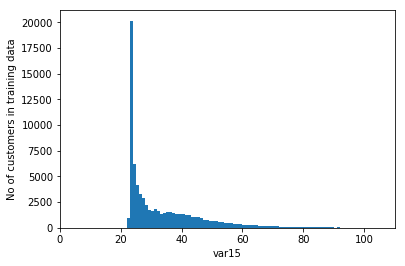

In [36]:
# histogram for var38
plt.hist(cpy_traindata['var15'], bins=100)
plt.ylabel('No of customers in training data')
plt.xlabel('var15')
plt.show()
# looks right skewed histogram

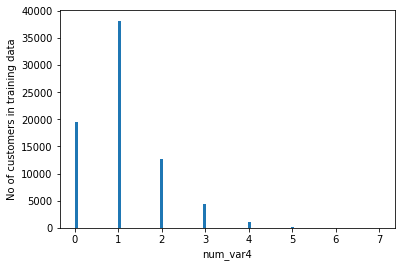

In [37]:
# histogram for num_var4
plt.hist(cpy_traindata['num_var4'], bins=100)
plt.ylabel('No of customers in training data')
plt.xlabel('num_var4')
plt.show()